In [1]:
from ClusterMap.clustermap import *
from anndata import AnnData
import tifffile
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import scipy.io
import math
from tqdm import tqdm

Matplotlib is building the font cache; this may take a moment.


In [9]:
# loading the data
filepath = "/Volumes/KINGSTON/data/phd/spatial-transcriptomics/"

dapi = tifffile.imread(filepath+"A1_DAPI.tiff")

column_names = ["spot_location_1", "spot_location_2", "spot_location_3", "gene_name"]
spots = pd.read_csv(filepath+"A1_results.txt", delimiter="\t", usecols=[0,1,2,3], header = None, names=column_names)


In [5]:
spots.head(10)


,spot_location_1,spot_location_2,spot_location_3,gene_name
0,9,16,16,Slc3a2
1,63,416,17,Slc3a2
2,187,105,17,Slc3a2
3,24,539,18,Slc3a2
4,37,484,18,Slc3a2
5,38,102,18,Slc3a2
6,59,442,18,Slc3a2
7,62,652,18,Slc3a2
8,87,172,18,Slc3a2
9,97,457,18,Slc3a2


In [6]:
### convert gene_name to gene identity
genes=pd.DataFrame(spots['gene_name'].unique())
a1=list(genes[0])
gene=list(map(lambda x: a1.index(x)+1, spots['gene_name']))
spots['gene']=gene
spots['gene']=spots['gene'].astype('int')

# ### save gene annotation as genelist.csv
genes.to_csv(filepath+'clustermap_genelist.csv', header=False, index=False)

Text(0.5, 1.0, 'raw data')

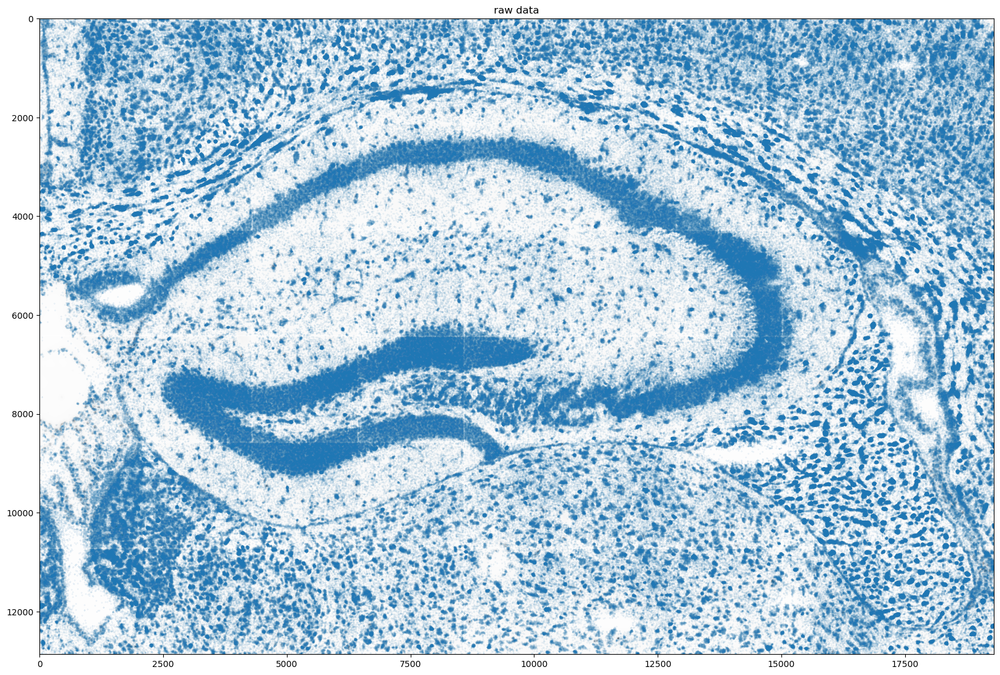

In [7]:
# overview
plt.figure(figsize=(20,20))
length=1000
plt.imshow(dapi,cmap='Greys')
plt.scatter(spots['spot_location_1'],spots['spot_location_2'],s=0.005)
plt.title('raw data')

In [8]:
### set radius parameters
xy_radius=35

In [9]:
num_gene=np.max(spots['gene'])

gene_list=np.arange(1,num_gene+1)
num_dims=len(dapi.shape)
model = ClusterMap(spots=spots, dapi=dapi, gene_list=gene_list, num_dims=num_dims,
                   xy_radius=xy_radius,z_radius=0,fast_preprocess=True)

In [10]:
### trim
img = dapi
window_size=1500
label_img = get_img(img, spots, window_size=window_size, margin=math.ceil(window_size*0.1))
out = split(img, label_img, spots, window_size=window_size, margin=math.ceil(window_size*0.1))

Split finished: 117 tiles


Text(0.5, 1.0, 'splitted tile: 80')

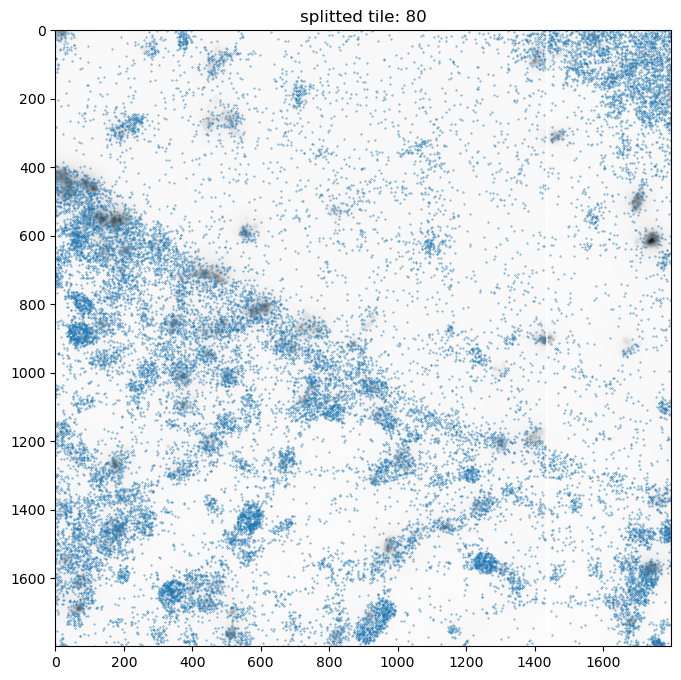

In [11]:
###plot a tile
tile_num=80
plt.figure(figsize=(8,8))
plt.imshow(out.loc[tile_num,'img'],cmap='Greys')

plt.scatter(out.loc[tile_num,'spots']['spot_location_1'],
            out.loc[tile_num,'spots']['spot_location_2'],s=0.1)
plt.title(f'splitted tile: {tile_num}')

In [ ]:
%%time

### process each tile
pct_filter=0
model.spots['clustermap']=-1

for tile_num in range(out.shape[0]):
    print(f'tile: {tile_num}')
    spots_tile=out.loc[tile_num,'spots']
    dapi_tile=out.loc[tile_num,'img']

    ### instantiate model
    model_tile = ClusterMap(spots=spots_tile, dapi=dapi_tile, gene_list=gene_list, num_dims=num_dims,
                   xy_radius=xy_radius,z_radius=0,fast_preprocess=False)

    ###preprocessing
    model_tile.preprocess(dapi_grid_interval=3,pct_filter=pct_filter)

    # ### segmentation
    model_tile.min_spot_per_cell=5
    model_tile.segmentation(cell_num_threshold=0.1,dapi_grid_interval=3,add_dapi=True,use_genedis=True)

    # ### plot cell segmentation results in spots (colored by cells)
    model_tile.plot_segmentation(figsize=(4,4),s=0.01,plot_with_dapi=True,plot_dapi=True, show=False)

    # ### stitch tiles together
    model.stitch(model_tile,out,tile_num)
    model.plot_segmentation(figsize=(30,15),s=0.05,plot_with_dapi=False,plot_dapi=True, show=False)
    plt.show()

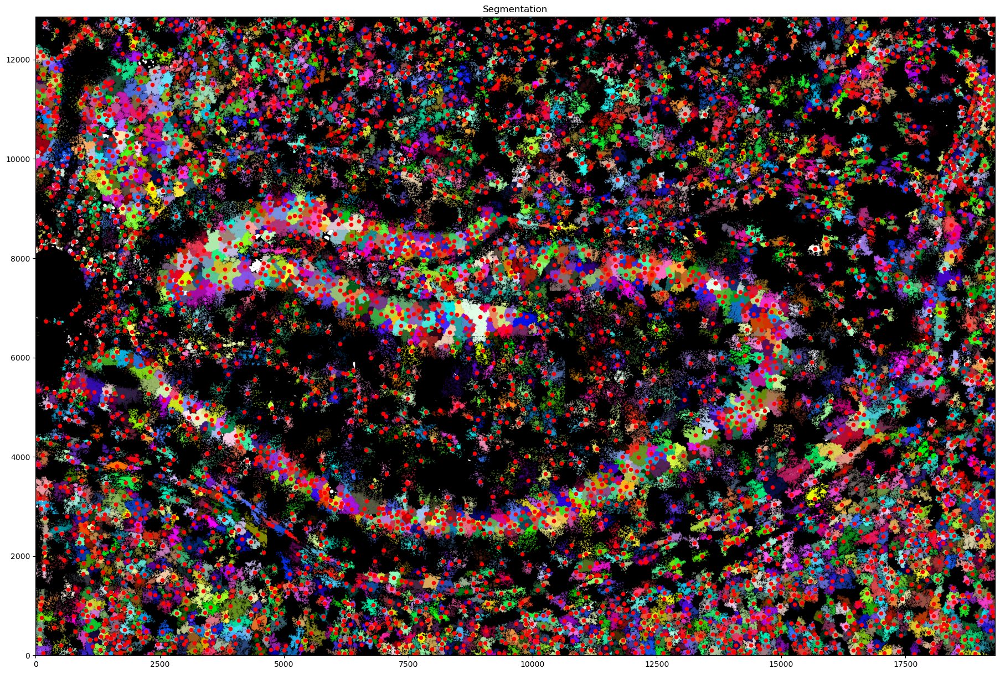

In [13]:
model.plot_segmentation(figsize=(30,15),s=0.05,plot_with_dapi=False,plot_dapi=True, show=False)
plt.scatter(model.cellcenter_unique[:,1],model.cellcenter_unique[:,0],c='r',s=20)
plt.show()

In [14]:
path_save = filepath+'A1_spots_all.csv'
model.save_segmentation(path_save)

In [15]:
model.create_convex_hulls()

Creat cell convex hull
Used 113 / 113


In [35]:
import alphashape
import geopandas as gpd
import spatialdata as sd
from spatialdata import SpatialData
import anndata as ad
import xarray as xr

In [6]:
def alphashape_poly_generate(molecules, x_label="x", y_label="y", alpha=0.05):
    points = np.array([molecules[x_label], molecules[y_label]]).T
    poly = alphashape.alphashape(points, alpha).buffer(0)
    # Get rid of weird self-intersections
    poly = poly.buffer(5).buffer(-5).buffer(0)
    return poly

In [11]:
# Assuming model.spots contains your ClusterMap results
spots_df = pd.read_csv(filepath+'A1_spots_all.csv')

# Create a list to hold cell data
cell_data = []
cell_ids = []

spots_df

,spot_location_1,spot_location_2,spot_location_3,gene_name,gene,clustermap
0,9,16,16,Slc3a2,1,23
1,63,416,17,Slc3a2,1,40
2,187,105,17,Slc3a2,1,23
3,24,539,18,Slc3a2,1,40
4,37,484,18,Slc3a2,1,40
...,...,...,...,...,...,...
2531362,19015,12669,54,Adgrl1,96,7743
2531363,19007,12662,55,Adgrl1,96,7743
2531364,19062,10925,55,Adgrl1,96,7007
2531365,17961,12368,56,Adgrl1,96,7687


In [12]:
unique_cell_ids = spots_df[spots_df['clustermap'] > -1]['clustermap'].unique()

In [13]:
print("Converting clustermap results to alphashape polygons")
for cell_id in unique_cell_ids:
    # Filter spots belonging to this cell
    df = spots_df[spots_df['clustermap'] == cell_id]
    
    # Skip if too few points
    if len(df) < 3:
        continue
        
    # Generate the polygon
    try:
        cell_poly = alphashape_poly_generate(
            df, x_label="spot_location_1", y_label="spot_location_2", alpha=0.05
        )
        cell_data.append(cell_poly)
        cell_ids.append(cell_id)
    except Exception as e:
        print(f"Error processing cell {cell_id}: {e}")

Converting clustermap results to alphashape polygons


In [14]:
# Create a GeoDataFrame with cell IDs
cells_gdf = gpd.GeoDataFrame({
    'cell_id': cell_ids,
    'geometry': cell_data
})

In [15]:
# save the cells_gdf
gdf_path_save = filepath+'A1_cell_polygons.csv'
cells_gdf.to_csv(gdf_path_save)

In [16]:
from shapely.geometry import Polygon, Point

# Now let's create point geometries for each spot
spots_geometry = [Point(row['spot_location_1'], row['spot_location_2']) for _, row in spots_df.iterrows()]
spots_gdf = gpd.GeoDataFrame(
    spots_df.copy(),
    geometry=spots_geometry
)

In [17]:
# Create cell-level data (aggregating gene counts by cell)
# Group spots by clustermap ID and count genes
cell_gene_counts = spots_df.groupby(['clustermap', 'gene_name']).size().reset_index(name='count')

# Pivot to get a gene x cell matrix
gene_count_matrix = cell_gene_counts.pivot(
    index='clustermap', 
    columns='gene_name', 
    values='count'
).fillna(0)

In [18]:
# Create AnnData object for gene expression
adata = ad.AnnData(
    X=gene_count_matrix.values,
    obs=pd.DataFrame(index=gene_count_matrix.index),
    var=pd.DataFrame(index=gene_count_matrix.columns)
)

/Users/cgeyskens/miniconda3/envs/spatial-transcriptomics/lib/python3.9/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [24]:
# Create the SpatialData object with all the components
sdata = SpatialData()

In [26]:
dapi.shape

(12864, 19296)

In [46]:
# Parsing the DAPI image

import pytest
from spatialdata.models import Image2DModel

# Assuming dapi is your loaded DAPI image array with shape (height, width)
# Add a channel dimension
dapi_with_channel = dapi[np.newaxis, :, :]  # Shape becomes (1, height, width)

# Now parse the data
parsed_image = Image2DModel.parse(dapi_with_channel)

# Should now pass validation
Image2DModel().validate(parsed_image)

# parsed_image is a regular xarray.DataArray object (discussed later), and as such it can be used outside
# the SpatialData library (e.g. with the libraries dask-image, xarray-spatial, ...)
parsed_image

INFO     no axes information specified in the object, setting `dims` to: ('c', 'y', 'x')                           


<xarray.DataArray 'image' (c: 1, y: 12864, x: 19296)> Size: 496MB
dask.array<array, shape=(1, 12864, 19296), dtype=uint16, chunksize=(1, 8192, 8192), chunktype=numpy.ndarray>
Coordinates:
  * c        (c) int64 8B 0
  * y        (y) float64 103kB 0.5 1.5 2.5 3.5 ... 1.286e+04 1.286e+04 1.286e+04
  * x        (x) float64 154kB 0.5 1.5 2.5 3.5 ... 1.929e+04 1.929e+04 1.93e+04
Attributes:
    transform:  {'global': Identity }

In [56]:
# Parsing the points

from spatialdata.models import PointsModel

# Define dtypes explicitly
dtypes = {
    "spot_location_1": float,
    "spot_location_2": float,
    "spot_location_3": float,
    "gene_name": 'category',
    "gene": "category",
    "clustermap": "category",   
}

spots_df = pd.read_csv("/Volumes/KINGSTON/data/phd/spatial-transcriptomics/A1_spots_all.csv", dtype=dtypes)
parsed_points = PointsModel.parse(spots_df, coordinates={"x": "spot_location_1", "y": "spot_location_2"})


In [ ]:
# Parsing the shapes (polygons)
